###**1. Author**
**Ritika Gupta**





Formulated a machine learning problem that can be attempted using the MLEnd Hums and Whistles dataset and build a solution model. 






### **2. Problem Formulation**

Below we will solve a machine learning problem that takes as an input a Frozen or StarWars audio segments and predicts the emotions(happy or neutral) present in the audio signals.

The interesting  thing about it is the features extracted from the audio signals of Frozen and StarWars audio signals and modelling the features through MLP classifier to predict the emotions.(happy or neutral).Predicting emotions would be useful in many areas like call centre to predict the emotion of their customers and greet them accordingly.

### **3. Machine Learning pipeline**


**Input :** 
For the input we have taken "Humming or Whistling" Starwars or Frozen audio files.

**Output:** 
For the output we would be gettting "Happy" or "Neutral" emotions

**Intermediate Stages:**

1. Environment Setup: Loading the required libraries and accessing to drive
2. Data Accessing from Drive
3. Exploratory Data Analysis

Finding the number of files in the google drive "Mini_Project" folder.

Displaying the various(5) audio files

Getting the name of the audio files
4. Extracted Features:

MFCC (mfcc)


Chroma (chroma)


MEL Spectrogram Frequency (mel)

5. Building training and testing data
6. Modelling 
7. Finding Accuracy
8. Displaying the Classification Report
9. Displaying the confusion matrix



###**4. Transformation stage**
For each audio file we computed the respective 3 features.The three features we used are as follows
1.   MFCC (mfcc) 
2.   Chroma (chroma)
3.   MEL Spectrogram Frequency (mel)


We got the corresponding y(emotion) for each file .We prepared our training dataset with all features stored in X and all labels in y vector.




###**5. Modelling**

MLP classifier is used .We have split the dataset defined by X_train,y_train and X_test,y_test  into a training set and a testing set.

###  **6. Methodology**
1. For training and testing the dataset I have split the dataset and modelled through MLP.
2. Computed accuracy of the MLP model
3. Displayed the Classification Report
4. Displayed confusion matrix 




### **7. Dataset**
Below I have used "Starwars" and  "Frozen" audio files stored in the folder "MiniProject_Advance" in Google drive

#####**Environment Setup:**



Accessing to drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
!pip install librosa soundfile numpy sklearn pyaudio

  ERROR: Failed building wheel for pyaudio
  Running setup.py clean for pyaudio
Failed to build pyaudio
    Running setup.py install for pyaudio ... error
ERROR: Command errored out with exit status 1: /usr/bin/python3 -u -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'/tmp/pip-install-yfp5ir1b/pyaudio_250c75b9a6a047d490711cf6dc04c2bf/setup.py'"'"'; __file__='"'"'/tmp/pip-install-yfp5ir1b/pyaudio_250c75b9a6a047d490711cf6dc04c2bf/setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' install --record /tmp/pip-record-p9elovas/install-record.txt --single-version-externally-managed --compile --install-headers /usr/local/include/python3.7/pyaudio Check the logs for full command output.


In [ ]:
!pip install soundfile

**Loading the required libraries and accessing to drive**

In [ ]:
import soundfile # to read audio file
import numpy as np
import IPython.display as ipd
import librosa # to extract speech features
import os,glob
import pickle # to save model after training
from sklearn.model_selection import train_test_split # for splitting training and testing
from sklearn.neural_network import MLPClassifier # multi-layer perceptron model
from sklearn.metrics import accuracy_score # to measure how good we are

#####**Data Accessing from Drive**

In this section we will access the data that we need to build our solution. Note that even though we call it "training" dataset you can do whatever you want with it, for instance validation tasks. Note that we keep a separate dataset for testing purposes, which we won't share with anyone.

We are accessing the dataset of (Frozen and StarWars audio files) by giving a google drive path.

In [ ]:
path = '/content/drive/MyDrive/MiniProject_Advance'
os.listdir(path)

['S190_whistle_2_StarWars_01.wav',
 'S122_whistle_2_StarWars_01.wav',
 'S190_hum_2_StarWars_01.wav',
 'S198_whistle_2_StarWars_01.wav',
 'S122_hum_2_StarWars_01.wav',
 'S198_hum_2_StarWars_01.wav',
 'S201_hum_3_StarWars_01.wav',
 'S201_hum_4_StarWars_01.wav',
 'S100_hum_3_StarWars_01.wav',
 'S100_hum_4_StarWars_01.wav',
 'S131_hum_2_StarWars_01.wav',
 'S196_hum_4_StarWars_01.wav',
 'S200_whistle_2_StarWars_01.wav',
 'S88_hum_1_StarWars_01.wav',
 'S196_hum_3_StarWars_01.wav',
 'S88_hum_2_StarWars_01.wav',
 'S131_whistle_2_StarWars_01.wav',
 'S200_hum_2_StarWars_01.wav',
 'S216_hum_4_StarWars_01.wav',
 'S176_whistle_2_StarWars_01.wav',
 'S21_hum_4_StarWars_01.wav',
 'S84_hum_3_StarWars_01.wav',
 'S216_hum_3_StarWars_01.wav',
 'S176_hum_2_StarWars_01.wav',
 'S84_hum_4_StarWars_01.wav',
 'S21_hum_3_StarWars_01.wav',
 'S187_hum_2_StarWars_01.wav',
 'S63_hum_3_StarWars_01.wav',
 'S111_hum_3_StarWars_01.wav',
 'S26_hum_3_StarWars_01.wav',
 'S187_whistle_2_StarWars_01.wav',
 'S26_hum_4_StarWar

**Exploratory Data Analysis**


Finding the number of files in the google drive "MiniProject_Advance" folder.

In [ ]:
sample_path = '/content/drive/MyDrive/MiniProject_Advance/*.wav'
files = glob.glob(sample_path)
len(files)

831

**Displaying the random(5) audio files**

In [ ]:
for _ in range(5):
  n = np.random.randint(831)
  display(ipd.Audio(files[n]))

##### **Getting the name of the audio files**

In [ ]:
for file in files:
  print(file.split('/')[-1])

S190_whistle_2_StarWars_01.wav
S122_whistle_2_StarWars_01.wav
S190_hum_2_StarWars_01.wav
S198_whistle_2_StarWars_01.wav
S122_hum_2_StarWars_01.wav
S198_hum_2_StarWars_01.wav
S201_hum_3_StarWars_01.wav
S201_hum_4_StarWars_01.wav
S100_hum_3_StarWars_01.wav
S100_hum_4_StarWars_01.wav
S131_hum_2_StarWars_01.wav
S196_hum_4_StarWars_01.wav
S200_whistle_2_StarWars_01.wav
S88_hum_1_StarWars_01.wav
S196_hum_3_StarWars_01.wav
S88_hum_2_StarWars_01.wav
S131_whistle_2_StarWars_01.wav
S200_hum_2_StarWars_01.wav
S216_hum_4_StarWars_01.wav
S176_whistle_2_StarWars_01.wav
S21_hum_4_StarWars_01.wav
S84_hum_3_StarWars_01.wav
S216_hum_3_StarWars_01.wav
S176_hum_2_StarWars_01.wav
S84_hum_4_StarWars_01.wav
S21_hum_3_StarWars_01.wav
S187_hum_2_StarWars_01.wav
S63_hum_3_StarWars_01.wav
S111_hum_3_StarWars_01.wav
S26_hum_3_StarWars_01.wav
S187_whistle_2_StarWars_01.wav
S26_hum_4_StarWars_01.wav
S70_hum_3_StarWars_01.wav
S70_hum_4_StarWars_01.wav
S19_hum_3_StarWars_01.wav
S164_hum_2_StarWars_01.wav
S164_hum_1_S

##### **Getting full path and other details of a audio file at index n=0**

In [ ]:
print('The full path to the first audio file is: ', files[0])
print('\n')
print('The name of the first audio file is: ', files[0].split('/')[-1])
print('    The participand ID is: ', files[0].split('/')[-1].split('_')[0])
print('    The type of interpretation is: ', files[0].split('/')[-1].split('_')[1])
print('    The interpretation number is: ', files[0].split('/')[-1].split('_')[2])
print('    The song is: ', files[0].split('/')[-1].split('_')[3])
print('    The emotion_index is: ', files[0].split('/')[-1].split('_')[4])

The full path to the first audio file is:  /content/drive/MyDrive/MiniProject_Advance/S190_whistle_2_StarWars_01.wav


The name of the first audio file is:  S190_whistle_2_StarWars_01.wav
    The participand ID is:  S190
    The type of interpretation is:  whistle
    The interpretation number is:  2
    The song is:  StarWars
    The emotion_index is:  01.wav


##### **Displaying the audio signal**

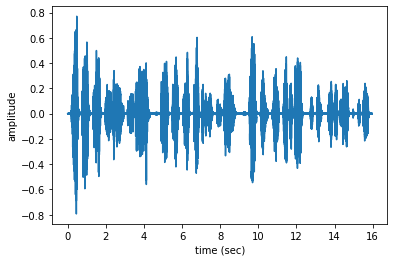

In [ ]:
import matplotlib.pyplot as plt
import IPython.display as ipd
n=0
fs = None # Sampling frequency. If None, fs would be 22050
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

##### **Displaying the number of samples in a audio file**

In [ ]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 704027 samples


One approach is to extract a few features from our signals and use these features instead as predictors. In the following cell, we define a function that extracts three features from an audio signal, namely:


1. MFCC (mfcc)


2. Chroma (chroma)


3. MEL Spectrogram Frequency (mel)



In [ ]:
def extract_feature(file_name,mfcc,chroma,mel):
   
    X,sample_rate=librosa.load(os.path.join(file_name),res_type='kaiser_fast')
    if chroma:
      stft = np.abs(librosa.stft(X))
    result = np.array([])
    if mfcc:
      mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T, axis=0)
      result = np.hstack((result, mfccs))
    if chroma:
      chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
      result = np.hstack((result, chroma))
    if mel:
      mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
      result = np.hstack((result, mel))
    return result


Building a dictionary of all emotions and putting the "happy" and "neutral" emotions in the observed_emotions.If the song index matched with the emotions in the emotions dictionary then that particular(01:neutral or 03:happy) will be assigned to that particular audio file.

In [ ]:
#Making a dictionary of all emotions
emotions = {
    "01": "neutral",
    "02": "calm",
    "03": "happy",
    "04": "sad",
    "05": "angry",
    "06": "fearful",
    "07": "disgust",
    "08": "surprised"
}

# we allow only these emotions 
observed_emotions = {
    "neutral",
    "happy"
}

Adding features to X and corresponding emotions labels to 'y'.Getting the emotions from the "emotions" dictionary.

In [ ]:

def load_data(test_size=0.2):
    X, y = [], []
    for file in glob.glob("/content/drive/My Drive/MiniProject_Advance/*.wav"):
        # get the base name of the audio file
        file_name = os.path.basename(file)
        # get the emotion label
        #print(file_name[:-4])
        file_name_new=file_name[:-4]
        print(file_name)
        emotion = emotions[file_name_new.split("_")[4]]
        print(emotion)
        # we allow only AVAILABLE_EMOTIONS we set
        if emotion not in observed_emotions:
            continue
        # extract speech features
        features = extract_feature(file, mfcc=True, chroma=True, mel=True)
        # add to data
        X.append(features)
        #print(X)
        y.append(emotion)
       
    return train_test_split(np.array(X), y, test_size=test_size,train_size=0.75,random_state=9)
 
  

##### **Modeling: Multi Layer Perceptron**
Splitting the dataset into X and y training and testing set in which X_train will have the training features and y_train will have corresponding emotion.Similarly X_test will have testing features and y_test will have corresponding emotion.

In [ ]:
X_train, X_test, y_train, y_test = load_data(test_size=0.25)

S190_whistle_2_StarWars_01.wav
neutral
S122_whistle_2_StarWars_01.wav
neutral
S190_hum_2_StarWars_01.wav
neutral
S198_whistle_2_StarWars_01.wav
neutral
S122_hum_2_StarWars_01.wav
neutral
S198_hum_2_StarWars_01.wav
neutral
S201_hum_3_StarWars_01.wav
neutral
S201_hum_4_StarWars_01.wav
neutral
S100_hum_3_StarWars_01.wav
neutral
S100_hum_4_StarWars_01.wav
neutral
S131_hum_2_StarWars_01.wav
neutral
S196_hum_4_StarWars_01.wav
neutral
S200_whistle_2_StarWars_01.wav
neutral
S88_hum_1_StarWars_01.wav
neutral
S196_hum_3_StarWars_01.wav
neutral
S88_hum_2_StarWars_01.wav
neutral
S131_whistle_2_StarWars_01.wav
neutral
S200_hum_2_StarWars_01.wav
neutral
S216_hum_4_StarWars_01.wav
neutral
S176_whistle_2_StarWars_01.wav
neutral
S21_hum_4_StarWars_01.wav
neutral
S84_hum_3_StarWars_01.wav
neutral
S216_hum_3_StarWars_01.wav
neutral
S176_hum_2_StarWars_01.wav
neutral
S84_hum_4_StarWars_01.wav
neutral
S21_hum_3_StarWars_01.wav
neutral
S187_hum_2_StarWars_01.wav
neutral
S63_hum_3_StarWars_01.wav
neutral
S11

Finding out the shapes of "X_train","X_test" and the "number features".

In [ ]:
# print some details
# number of samples in training data
print("[+] Number of training samples:", X_train.shape)
# number of samples in testing data
print("[+] Number of testing samples:", X_test.shape)
# number of features used
# this is a vector of features extracted 
# using extract_features() function
print("[+] Number of features:", X_train.shape[1])



[+] Number of training samples: (623, 180)
[+] Number of testing samples: (208, 180)
[+] Number of features: 180



### **8. Results**
Using MLP classifier,finding training and testing Accuracy



In [ ]:
model = MLPClassifier(alpha=0.01,batch_size=256,epsilon=1e-08, hidden_layer_sizes=(600,),learning_rate='adaptive', max_iter=500)

In [ ]:
model.fit(X_train,y_train)

MLPClassifier(alpha=0.01, batch_size=256, hidden_layer_sizes=(600,),
              learning_rate='adaptive', max_iter=500)

In [ ]:

yt_p = model.predict(X_train)
yv_p = model.predict(X_test)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_test))


Training Accuracy 1.0
Validation  Accuracy 0.6394230769230769


In [ ]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_test  = (X_test-mean)/sd

model = MLPClassifier(alpha=0.01,batch_size=256,epsilon=1e-08, hidden_layer_sizes=(600,),learning_rate='adaptive', max_iter=500)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_test)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_test))


Training Accuracy 1.0
Validation  Accuracy 0.6682692307692307


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,yv_p))

              precision    recall  f1-score   support

       happy       0.68      0.66      0.67       107
     neutral       0.65      0.67      0.66       101

    accuracy                           0.67       208
   macro avg       0.67      0.67      0.67       208
weighted avg       0.67      0.67      0.67       208



In [ ]:
from sklearn.metrics import confusion_matrix
matrix=confusion_matrix(y_test,yv_p)
print(matrix)

[[71 36]
 [33 68]]


### **9 Conclusions**

The accuracy is 1.00 for training dataset.But the most important question in classification (supervised learning) is that of generalization, that is to say the performances in production (or on the testing dataset). Actually, the performances on our learning dataset do not matter since it is only used to learn your model. Once it is done, you will never use it, and the performances on only data that has not been seen during learning will be submited to the model.The MLP model is complex enough (that has enough capacity) can perfectly fit to any learning dataset and obtain 100% accuracy on it. But by fitting perfectly to the training set, it will have poor performance on new data that are not seen during training (overfitting). Hence, it's not what interests us.However we can reduce the performances on the training dataset in order to better generalize, that is to say to get better performance on data that are not used during learning by using regularization.
